In [1]:
%matplotlib inline
import pandas as pd
import matplotlib.pyplot as plt

from caption_features import ARI, flesch, caption_stats

In [2]:
df = pd.read_csv('../contests/summaries/554_summary_LilUCB.csv')

df['readability_ARI'] = df.apply(ARI, axis=1)
df['readability_Flesch'] = df.apply(flesch, axis=1)
stats = pd.DataFrame(list(df.apply(caption_stats, axis=1)))
df = pd.concat([df, stats], axis=1)

df.head()

,Unnamed: 0,rank,caption,score,precision,count,unfunny,somewhat_funny,funny,readability_ARI,readability_Flesch,aux_verbs,indef_articles,n_sentences,n_words,negation_words,pronouns,proper_nouns,question_words,sentiment
0,0,1,You were with Ringling Brothers? I was with Le...,1.982092,0.010177,6645.0,2347.0,2070.0,2228.0,4.149000,100.240000,0,0,2,10,0,2,2,0,0.0000
1,1,2,"Well, it suits you better than the president c...",1.931655,0.039002,556.0,255.0,84.0,217.0,6.096667,103.700000,0,0,1,9,0,2,0,0,0.5000
2,2,3,"Sure, it's all fun and games. Until one of you...",1.916803,0.014894,3053.0,1171.0,965.0,917.0,-1.513846,115.637500,0,0,2,13,0,1,0,0,0.4000
3,3,4,"Hey, all I know is that they left in a very sm...",1.908179,0.017256,1993.0,691.0,794.0,508.0,-0.075385,115.547692,0,1,1,13,0,1,1,0,-0.1625
4,4,5,"Would you like that straight up, on the rocks,...",1.905750,0.014900,2939.0,1110.0,996.0,833.0,6.480000,67.530000,0,0,1,15,0,2,0,0,0.1500


In [13]:
from altair import Chart
from altair_widgets import interact_with

interact_with(df)

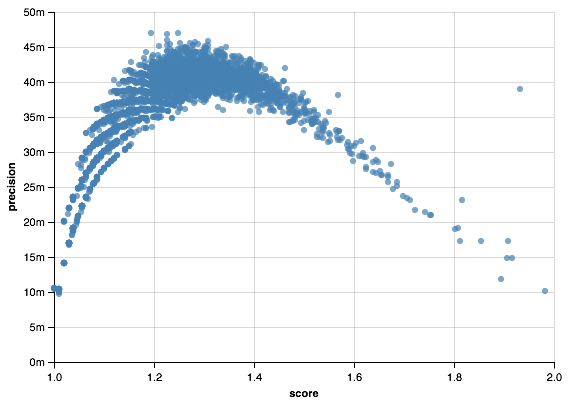

In [6]:
from altair import X, Scale
Chart(df).mark_circle().encode(x=X('score', scale=Scale(zero=False)), y='precision')

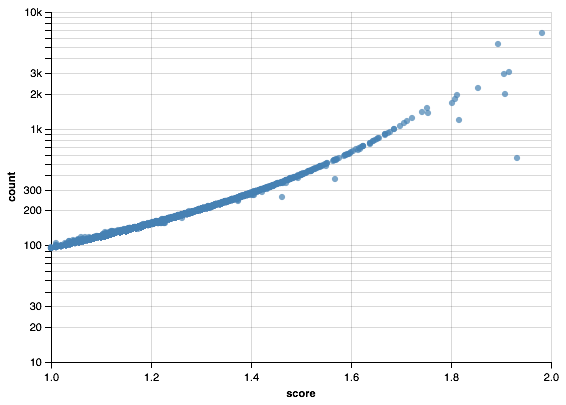

In [8]:
from altair import Y
Chart(df).mark_circle().encode(x=X('score', scale=Scale(zero=False)), y=Y('count', scale=Scale(type='log')))

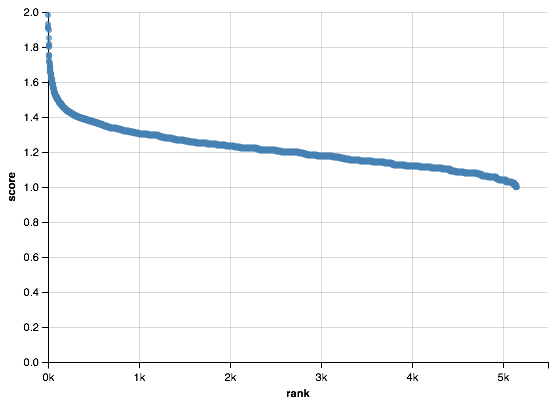

In [12]:
Chart(df).mark_circle().encode(x='rank', y='score')